# **Pixel Predictor**

# **Introduction**
# The Pixel Predictor models aims to predict missing or occluded pixels in an image using deep learning techniques. It leverages convolutional and fully connected layers to reconstruct masked regions with high fidelity

In [1]:
import torch
import torchvision
from sklearn import preprocessing

import matplotlib.pyplot as plt
from einops import rearrange

import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# **Implementation Overview**

The Pixel Predictor model follows a structured pipeline to reconstruct missing or occluded pixels in an image:

- **Dataset Preprocessing**:
      <br>Load and normalize images.
  <br>Apply artificial masking to simulate occlusion.
  
- **Feature Extraction**: Feature Extraction consists of three parts :Head, Neck, Bottom
   <br>**Head**: A convolutional-based Head extracts spatial features from the input image.
<br>**Neck**: The Neck module reduces dimensionality using fully connected layers.
<br>**Bottom**: The Bottom module reconstructs missing pixels using transposed convolutions.


- **Model Training**:
<br>Define the loss function (Mean Squared Error).
<br>Train the model on masked images using an adaptive learning rate strategy.


- **Inference and Reconstruction**:
<br>Predict missing pixels based on surrounding regions.
<br>Rescale output to the original intensity range.


- **Evaluation and Visualization**:
<br>Compare original, masked, and reconstructed images.
<br>Assess model performance using pixel-wise reconstruction accuracy.

In [2]:
class PixelPredictor():
    
    class FeatureExtractor(torch.nn.Module):
        
        class Head(torch.nn.Module):
            def __init__(self):
                super(PixelPredictor.FeatureExtractor.Head,self).__init__()
                self.layer1=torch.nn.Sequential(
                    torch.nn.Conv2d(in_channels=3,out_channels=32,kernel_size=3,stride=1,padding=1),
                    torch.nn.ReLU()
                )
                self.layer2=torch.nn.Sequential(
                    torch.nn.Conv2d(in_channels=32,out_channels=64,kernel_size=3,stride=1,padding=1),
                    torch.nn.ReLU(),
                    torch.nn.MaxPool2d(kernel_size=2,stride=2,padding=0)
                )
                self.layer3=torch.nn.Sequential(
                    torch.nn.Conv2d(in_channels=64,out_channels=128,kernel_size=3,stride=1,padding=1),
                    torch.nn.ReLU(),
                    torch.nn.AdaptiveAvgPool2d((50,50))
                )
            def forward(self,x):
                x=self.layer1(x)
                x=self.layer2(x)
                return self.layer3(x)
                
        class Neck(torch.nn.Module):
            def __init__(self):
                super(PixelPredictor.FeatureExtractor.Neck,self).__init__()
                self.layer1=torch.nn.Sequential(
                    torch.nn.Linear(in_features=128*50*50,out_features=128),
                    torch.nn.ReLU(),
                    torch.nn.Dropout(0.4)
                )
                self.layer2=torch.nn.Sequential(
                    torch.nn.Linear(in_features=128,out_features=256),
                    torch.nn.ReLU(),
                    torch.nn.Dropout(0.4)
                )
                self.layer3=torch.nn.Sequential(
                    torch.nn.Linear(in_features=256,out_features=512),
                    torch.nn.ReLU(),
                    torch.nn.Dropout(0.4)
                )
                self.layer4=torch.nn.Linear(in_features=512,out_features=128*50*50)
                
            def forward(self,x):
                batch_size=x.size(0)
                x=x.view(batch_size,-1)
                x=self.layer1(x)
                x=self.layer2(x)
                x=self.layer3(x)
                x=self.layer4(x)
                return x.view(batch_size,128,50,50)
                
        class Bottom(torch.nn.Module):
            def __init__(self,output_height,output_width):
                super(PixelPredictor.FeatureExtractor.Bottom,self).__init__()
                self.layer1=torch.nn.Sequential(
                    torch.nn.ConvTranspose2d(in_channels=128,out_channels=64,kernel_size=4,stride=2,padding=1),
                    torch.nn.ReLU()
                )
                self.layer2=torch.nn.Sequential(
                    torch.nn.Conv2d(in_channels=64,out_channels=3,kernel_size=3,stride=1,padding=1),
                )
                self.layer3=torch.nn.AdaptiveAvgPool2d((output_height,output_width))
                
            def forward(self,x):
                x=self.layer1(x)
                x=torch.sigmoid(self.layer2(x))
                x=self.layer3(x)
                return x
                
        def __init__(self,out_height,out_width):
            super(PixelPredictor.FeatureExtractor,self).__init__()
            self.head=PixelPredictor.FeatureExtractor.Head()
            self.neck=PixelPredictor.FeatureExtractor.Neck()
            self.bottom=PixelPredictor.FeatureExtractor.Bottom(out_height,out_width)

        def forward(self,x):
            x=self.head(x)
            x=self.neck(x)
            x=self.bottom(x)
            return x
            
    def __init__(self):
        self.input_image=None
        self.scaler_model=None
        self.output=None
        self.mask=None
        self.model=None
        self.patch_size=None
        self.lr=None

    def fit_predict(self,image,patchsize,lr):
        self.input_image=image
        self.patch_size=patchsize
        self.lr=lr
        self.output=self.input_image.clone()
        self.masking_function()
        scaled_image,self.scaler_model=self.scaler_function()
        self.model=PixelPredictor.FeatureExtractor(self.patch_size,self.patch_size).to(device)
        self.model_operator(scaled_image)
        return self.output
        
    def masking_function(self):
        self.mask=(self.input_image!=0).all(dim=0)
        
    def scaler_function(self):
        scaler_model=preprocessing.MinMaxScaler().fit(self.input_image.reshape(-1,1))
        scaled_input=scaler_model.transform(self.input_image.reshape(-1,1)).reshape(self.input_image.shape)
        return torch.tensor(scaled_input,dtype=torch.float32),scaler_model

    def model_operator(self,image):
        c,image_height,image_width=image.shape
        crop_height,crop_width=self.patch_size,self.patch_size

        pad_height=(crop_height-image_height%crop_height)%crop_height
        pad_width=(crop_width-image_width%crop_width)%crop_width
        
        padded_image=torch.nn.functional.pad(image,(0,pad_width,0,pad_height),mode='constant',value=0)
        padded_mask=torch.nn.functional.pad(self.mask,(0,pad_width,0,pad_height),mode='constant',value=0)
        for top in range(0,padded_image.shape[1],crop_height):
            for left in range(0,padded_image.shape[2],crop_width):
    
                crop_image=torchvision.transforms.functional.crop(padded_image,top,left,crop_height,crop_width)
                crop_mask=torchvision.transforms.functional.crop(self.mask,top,left,crop_height,crop_width)
                
                crop_image=crop_image.to(device)
                crop_mask=crop_mask.to(device)
                input_X=self.create_canvas(crop_image)
                self.train_model(self.model,input_X,crop_image,crop_mask,200,self.lr)
                Y_pred=self.predict(self.model,input_X,crop_image)
                Y_pred_rescaled=self.scaler_model.inverse_transform(Y_pred.cpu().numpy().reshape(-1,1)).reshape(Y_pred.shape)
                Y_pred_rescaled=torch.tensor(Y_pred_rescaled,dtype=torch.float32).squeeze(0)
                    
                self.output[:,top:top+crop_height,left:left+crop_width]=Y_pred_rescaled[:,:min(crop_height,image_height-top),:min(crop_width,image_width-left)]
                del input_X,Y_pred,Y_pred_rescaled,crop_image,crop_mask

    def create_canvas(self,image):
        canvas=torch.randn_like(image.cpu()).numpy()
        scaler_model=preprocessing.MinMaxScaler(feature_range=(-1,1)).fit(canvas.reshape(-1,1))
        grid=scaler_model.transform(canvas.reshape(-1,1)).reshape(canvas.shape)
        grid=torch.tensor(grid).float()
        return grid.to(device)
        
    def train_model(self,model,X,Y,mask,epochs,lr):
        critersion=torch.nn.MSELoss()
        optimizer=torch.optim.Adam(model.parameters(),lr)
        current_loss=0
        previous_loss=0
        for epoch in range(epochs):
            optimizer.zero_grad()
            Y_predict=model(X.unsqueeze(0))
            loss=critersion(Y_predict[0]*mask,Y*mask)
            loss.backward()
            optimizer.step()
            previous_loss=current_loss
            current_loss=loss.item()
            if (abs(current_loss-previous_loss)<0.0001):
                break

    def predict(self,model,X,image):
        model.eval()
        with torch.no_grad():
            Y_predict=model(X.unsqueeze(0))
        return Y_predict

In [3]:
import numpy as np

def masking_function(image,percent,size):
    c,height,width=image.shape
    num_pixels=int(percent*(height*width))
    mask=torch.zeros((height,width),dtype=torch.bool)
    for i in range(num_pixels):
        h=np.random.randint(0,height-1)
        w=np.random.randint(0,width-1)
        if (h+size<height and w+size<width):
            mask[h:h+size,w:w+size]=True
    masked_image=image.clone()
    masked_image[:,mask]=0.0
    return masked_image

In [4]:
import os

input_image_path_folder=os.path.join("/kaggle/input/input-images")
input_image_folder=os.listdir(input_image_path_folder)
input_image_folder=[os.path.join(input_image_path_folder,path) for path in input_image_folder]

# **Dataset**
The dataset consists of a collection of images where portions of each image are artifically masked to simulate occulsion. The model is trained to recover these missing parts using surrounding pixel information

In [5]:
input_image=torchvision.io.read_image("/kaggle/input/input-images/Volorful-parrot-animal-wallpaper-HD.jpg").float()/255.0
masked_image=masking_function(input_image,0.005,10)

# **Hyper Parameter Tuning**

In [6]:
def plot_images(original, corrupted, output, title):
    """Plot the original, corrupted, and output images in a single row."""
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(rearrange(original,'c h w->h w c'))
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(rearrange(corrupted,'c h w->h w c'))
    plt.title('Corrupted Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(rearrange(output,'c h w->h w c'))
    plt.title('Output Image')
    plt.axis('off')
    
    plt.suptitle(title)
    plt.show()

In [7]:
import torch
import torchvision
from skimage.metrics import peak_signal_noise_ratio as psnr
import numpy as np
import matplotlib.pyplot as plt

def hyperparameter_tuning_with_plot(input_image,masked_image,patch_sizes,learning_rates):
    psnr_results=np.zeros((len(learning_rates),len(patch_sizes)))
    
    for i,lr in enumerate(learning_rates):
        for j,patchsize in enumerate(patch_sizes):
            model=PixelPredictor()
            output=model.fit_predict(masked_image, patchsize=patchsize, lr=lr)
            output_np=output.detach().cpu().numpy().squeeze()
            input_np=input_image.detach().cpu().numpy().squeeze()
            current_psnr=psnr(input_np, output_np, data_range=1.0)
            plot_images(input_np,masked_image,output_np,f"Output: patchsize:{patchsize}, lr={lr}, PSNR:{current_psnr}")
            psnr_results[i, j]+=current_psnr
            del model,output
        
    best_idx=np.unravel_index(np.argmax(psnr_results), psnr_results.shape)
    best_lr=learning_rates[best_idx[0]]
    best_patchsize=patch_sizes[best_idx[1]]
    best_psnr=psnr_results[best_idx]

    return psnr_results,best_patchsize,best_lr,best_psnr

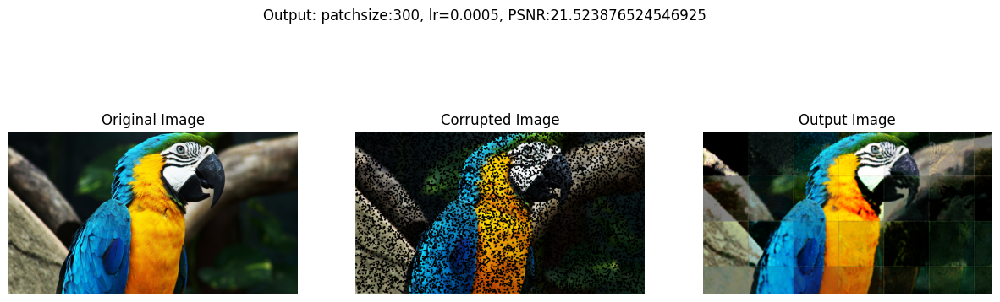

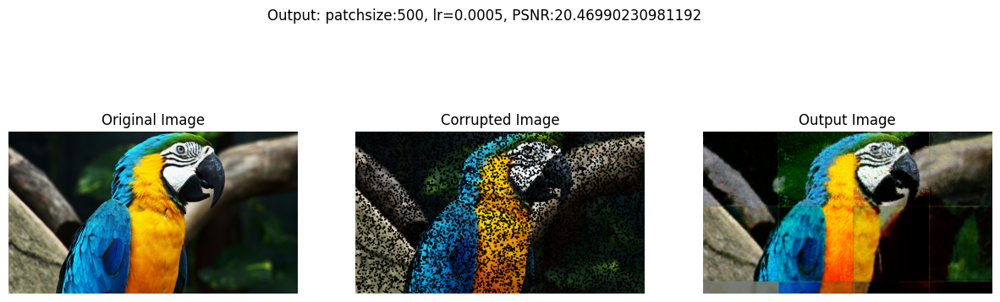

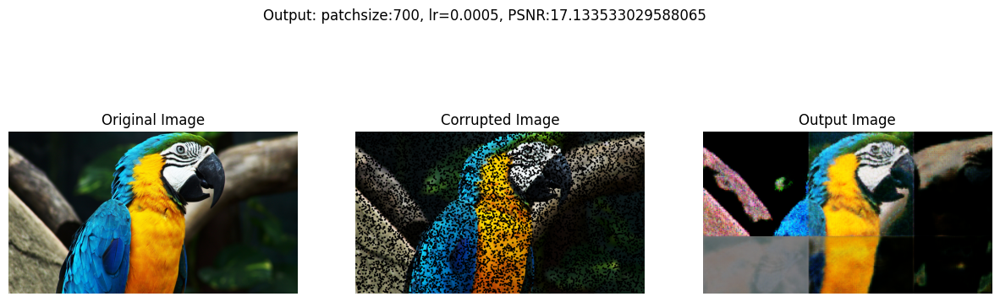

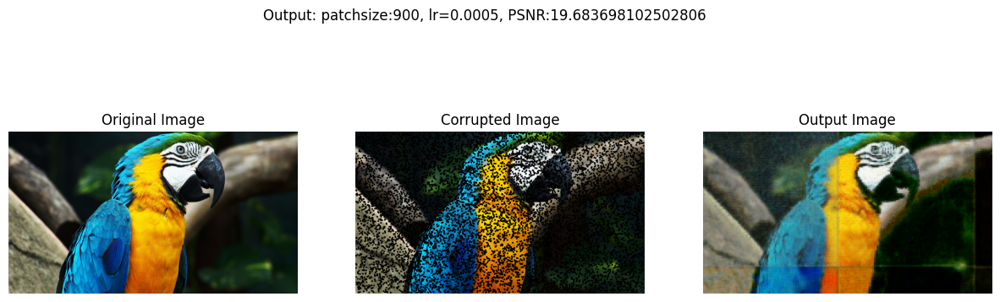

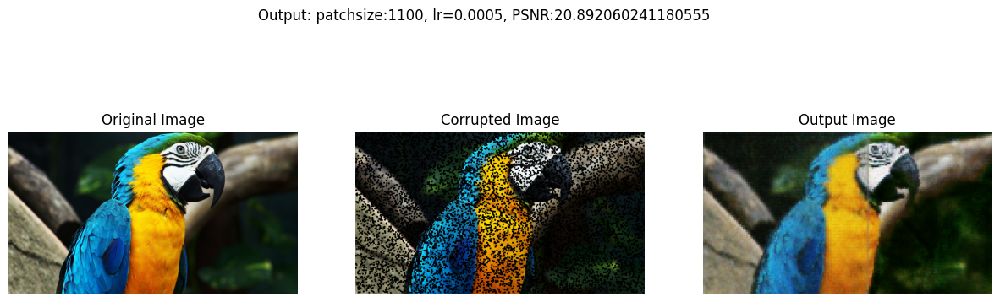

...

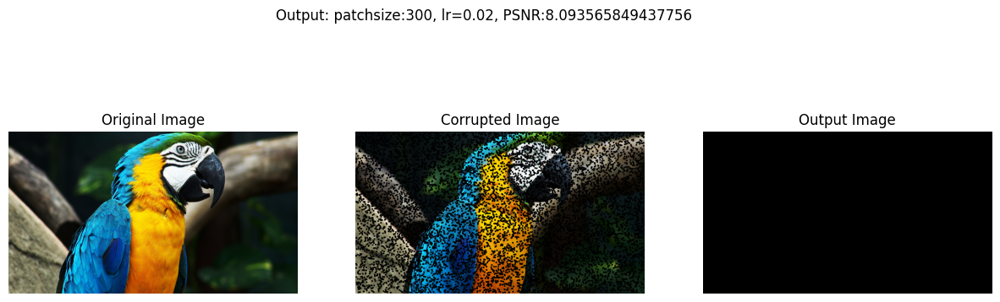

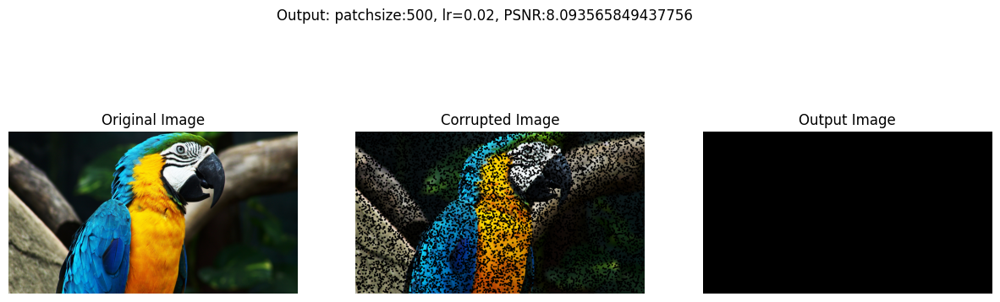

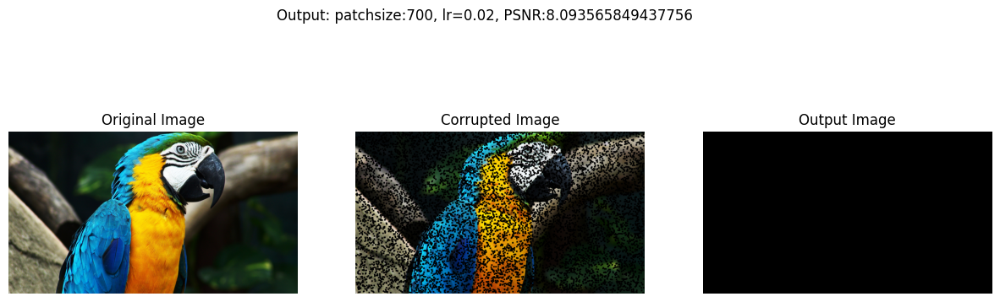

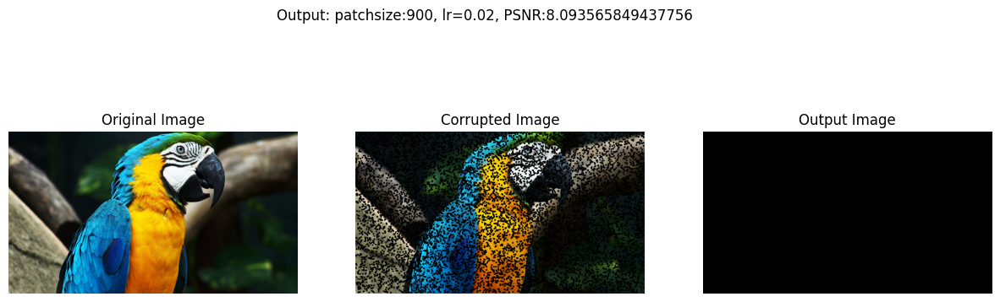

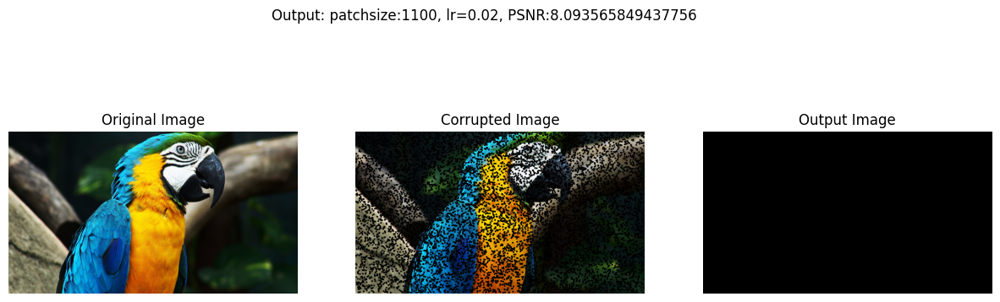

In [8]:
patch_sizes=[300,500,700,900,1100]
learning_rates=[0.0005,0.001,0.004,0.01,0.02]

psnr_results,best_patchsize,best_lr,best_psnr=hyperparameter_tuning_with_plot(input_image,masked_image,patch_sizes,learning_rates)

# **Analysis**

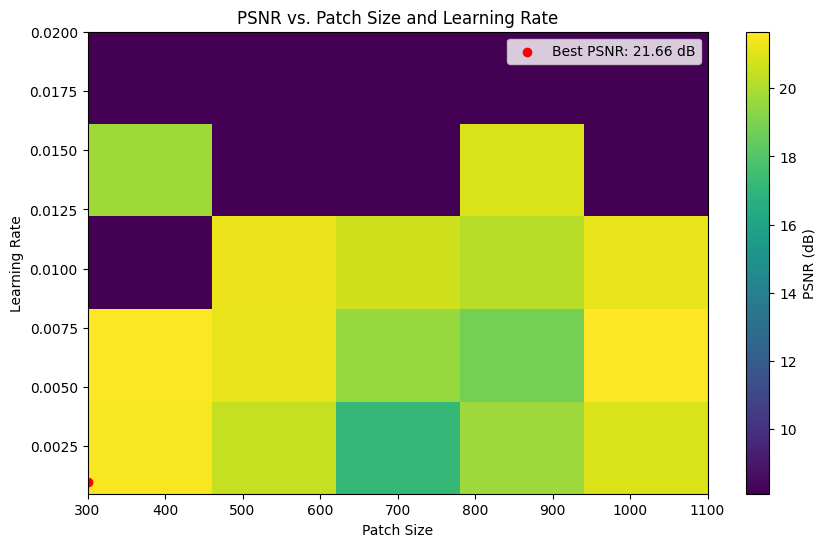

In [9]:
plt.figure(figsize=(10, 6))
plt.imshow(psnr_results,extent=[min(patch_sizes),max(patch_sizes),min(learning_rates),max(learning_rates)], 
           aspect='auto',origin='lower',cmap='viridis')
plt.colorbar(label='PSNR (dB)')
plt.xlabel('Patch Size')
plt.ylabel('Learning Rate')
plt.title('PSNR vs. Patch Size and Learning Rate')
plt.scatter(best_patchsize, best_lr, color='red',label=f'Best PSNR: {best_psnr:.2f} dB')
plt.legend()
plt.show()

# **Result**

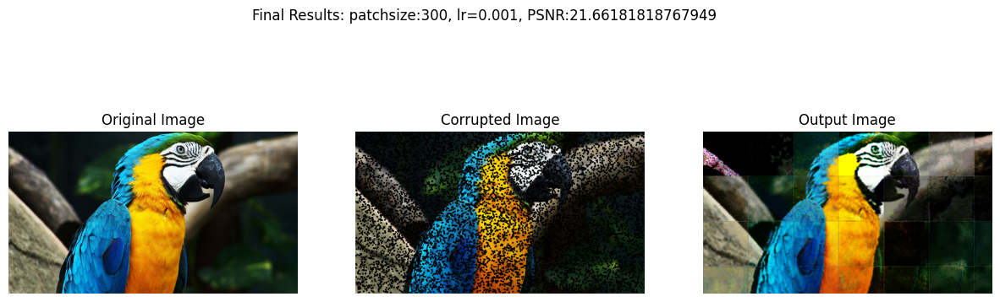

In [11]:
model=PixelPredictor()
output=model.fit_predict(masked_image, patchsize=best_patchsize, lr=best_lr)
output_np=output.detach().cpu().numpy().squeeze()
plot_images(input_image,masked_image,output_np,f"Final Results: patchsize:{best_patchsize}, lr={best_lr}, PSNR:{best_psnr}")